In [1]:
os.chdir('../../')
import ast
import os
import numpy as np
import pandas as pd
from tensorflow import keras
from keras.preprocessing import image
import matplotlib.pyplot as plt
from tqdm import tqdm
from dask import bag
from PIL import Image, ImageDraw 
from glob import glob
model = keras.models.load_model("models/5_Categories_model.h5")

In [10]:
import pickle
path = 'Data/'+str(5)+'_Categories/'
with open(path+'X_test.data', 'rb') as f:
    X_test = pickle.load(f)

predictions = model.predict(X_test) 

In [11]:
import seaborn as sns
sns.set_palette(sns.color_palette('Blues_r', 20))

In [16]:
l=os.listdir('Data/5_Categories/trainset/')
li=[x.split('.')[0] for x in l]

def prediction_pie(predictions):                
    for i in range(500):
        plt.subplot(1, 2, 1) # row 1, col 2 index 1
        plt.title("drawing")
        plt.imshow(X_test[i])
        plt.axis('off')
        plt.subplot(1, 2, 2) # index 2
        percent = 100.0*predictions[i]/predictions[i].sum()

        patches, texts = plt.pie(predictions[i], startangle=90, radius=1.2)
        labels = ['{0} - {1:1.2f} %'.format(i,j) for i,j in zip(li, percent)]

        sort_legend = True
        if sort_legend:
                patches, labels, dummy =  zip(*sorted(zip(patches, labels, predictions[i]),
                                                    key=lambda x: x[2],
                                                    reverse=True))


        plt.legend(patches, labels, loc='center', bbox_to_anchor=(1.8, 0.5), fontsize=12)
        plt.show()

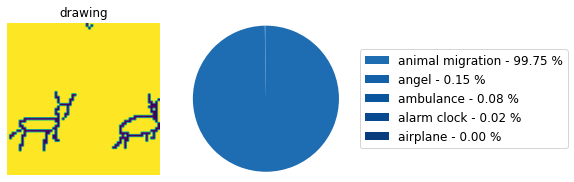

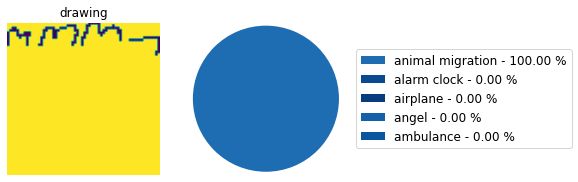

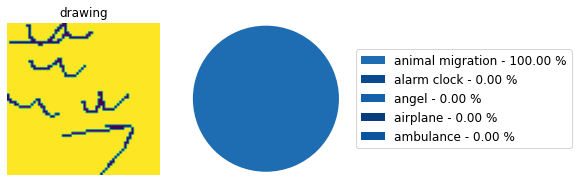

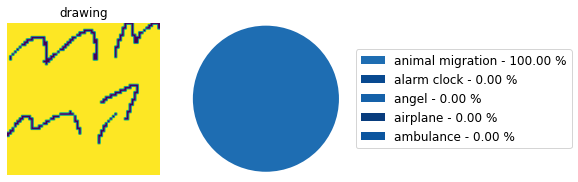

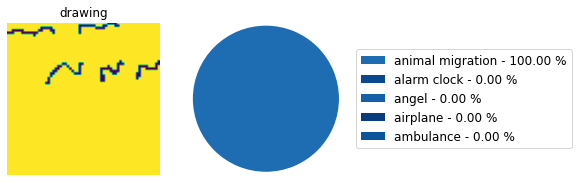

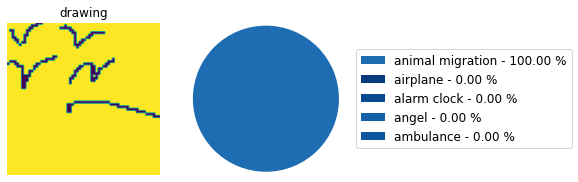

C:\Users\Brune\AppData\Local\Temp/ipykernel_20740/2952843333.py:13: MatplotlibDeprecationWarning: normalize=None does not normalize if the sum is less than 1 but this behavior is deprecated since 3.3 until two minor releases later. After the deprecation period the default value will be normalize=True. To prevent normalization pass normalize=False 
  patches, texts = plt.pie(predictions[i], startangle=90, radius=1.2)


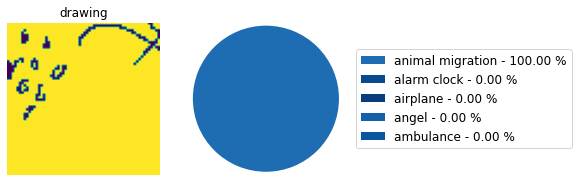

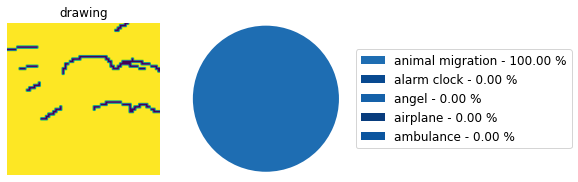

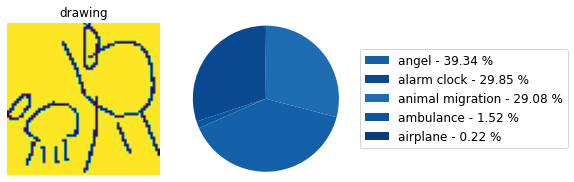

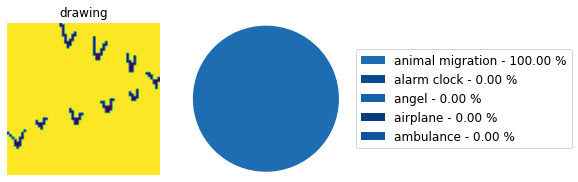

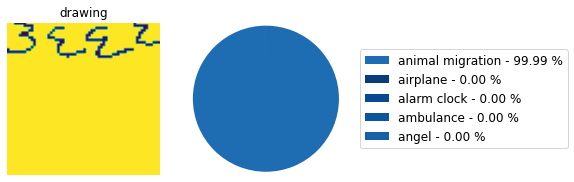

...

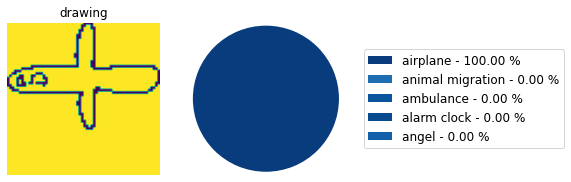

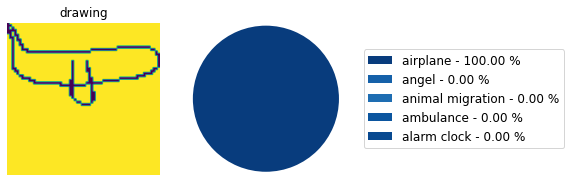

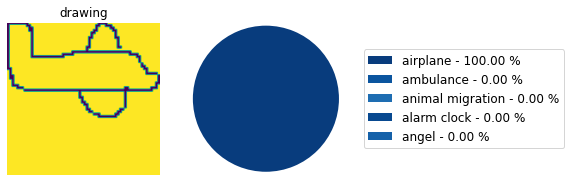

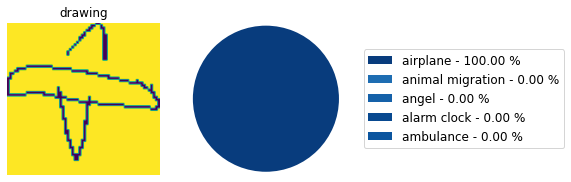

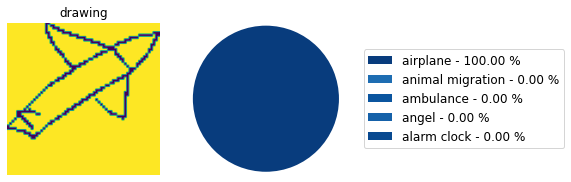

In [17]:
prediction_pie(predictions)